In [1]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import glob

%matplotlib inline
%config Inline.Backend.figure_format = 'retina'

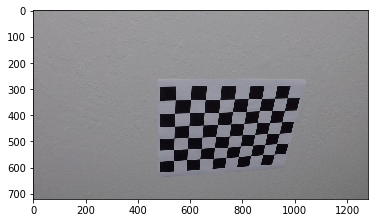

In [2]:
# Loading a sample camera calibration_image
sample_calibration_image = mpimg.imread('./camera_cal/calibration10.jpg')
plt.imshow(sample_calibration_image)
plt.show()

### there are 9 corners x direction and 6 corners in y direction as we can see in image above

So the number of corners we need to detect for camera calibration is (9, 6)

In [3]:
nx = 9
ny = 6

In [4]:
# Creating Obj Points and Image Points to find camera matrix and distortion matrix
obj_points = []
img_points = []

objp = np.zeros((nx*ny, 3), np.float32)
objp[:, :2] = np.mgrid[0:nx, 0:ny].T.reshape(-1, 2)

In [5]:
# Function to detect corners in image
def find_chessboard_corners(img):
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    return cv2.findChessboardCorners(gray, (nx, ny), None)

In [6]:
fname_images = glob.glob('./camera_cal/calibration*.jpg')

In [7]:
# Function to detect chessboard corners in all the calibration images
for fname in fname_images:
    img = mpimg.imread(fname)
    ret, corners = find_chessboard_corners(img)
    if ret == True:
        img_points.append(corners)
        obj_points.append(objp)    

In [8]:
# Function to undistort a image
def cal_undistort(img, objpoints, imgpoints):
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, gray.shape[::-1],None,None)
    undist = cv2.undistort(img, mtx, dist, None, mtx)
    return undist

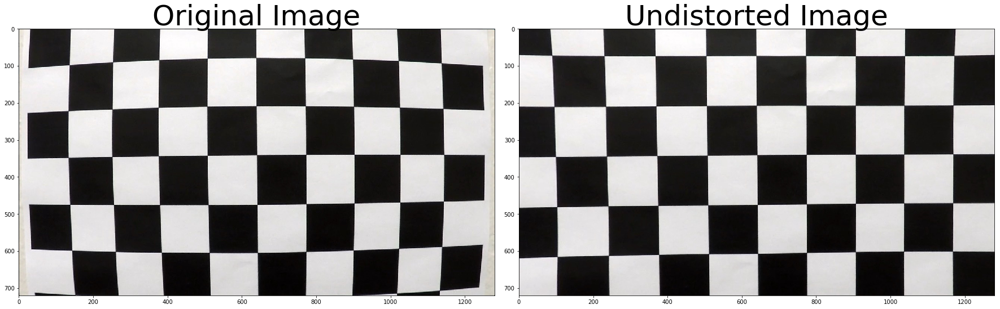

In [9]:
test_undistortion_image = mpimg.imread('test_undistortion.jpg')
test_undistorted_image = cal_undistort(test_undistortion_image, obj_points, img_points)

f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(test_undistortion_image)
ax1.set_title('Original Image', fontsize=50)
ax2.imshow(test_undistorted_image)
ax2.set_title('Undistorted Image', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

In [10]:
# Function to calculate sobel gradient along direction and return a binary thresholded image
def abs_sobel_threshold(img, orient = 'x', thresh = (0, 255), ksize = 3):
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    direction = (1, 0) if orient == 'x' else (0, 1) 
    sobel = cv2.Sobel(gray, cv2.CV_64F, direction[0], direction[1], ksize = ksize)
    abs_sobel = np.absolute(sobel)
    scaled_sobel = np.uint8(255*(abs_sobel/np.max(abs_sobel)))
    binary_sobel = np.zeros_like(scaled_sobel)
    binary_sobel[(scaled_sobel >= thresh[0]) & (scaled_sobel <= thresh[1])] = 1
    return binary_sobel

In [11]:
test_image = mpimg.imread('./test_images/test2.jpg')
test_image = cal_undistort(test_image, obj_points, img_points)

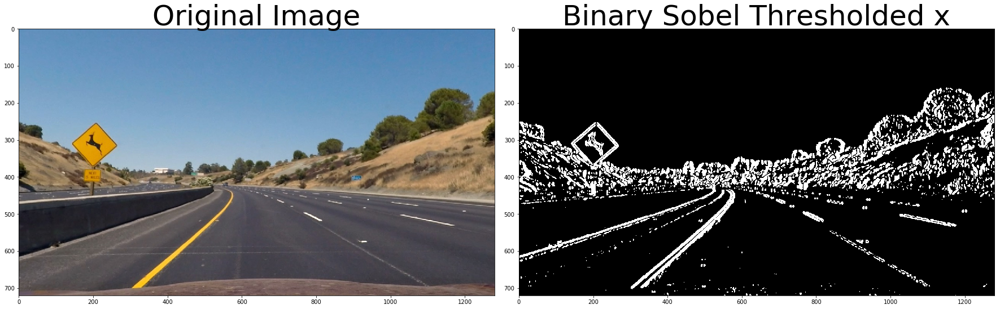

In [12]:
sobel_binary_x = abs_sobel_threshold(test_image, orient = 'x', thresh = (20, 200), ksize = 15)

f, (ax1, ax2) = plt.subplots(1, 2, figsize = (24, 9))
f.tight_layout()
ax1.imshow(test_image)
ax1.set_title('Original Image', fontsize = 50)
ax2.imshow(sobel_binary_x, cmap = 'gray')
ax2.set_title('Binary Sobel Thresholded x', fontsize = 50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

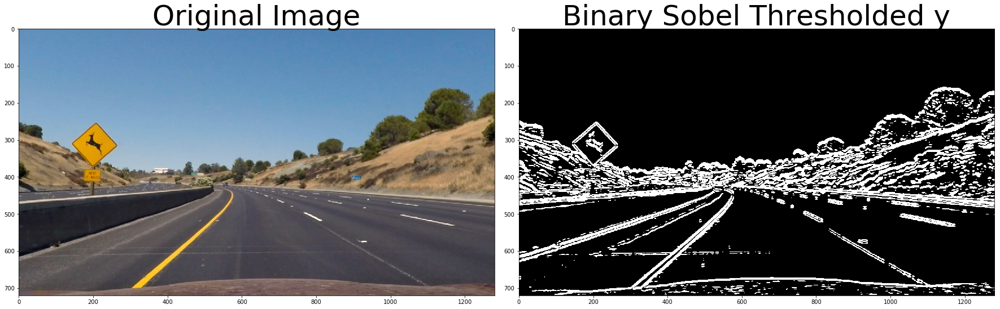

In [13]:
sobel_binary_y = abs_sobel_threshold(test_image, orient = 'y', thresh = (20, 200), ksize = 15)

f, (ax1, ax2) = plt.subplots(1, 2, figsize = (24, 9))
f.tight_layout()
ax1.imshow(test_image)
ax1.set_title('Original Image', fontsize = 50)
ax2.imshow(sobel_binary_y, cmap = 'gray')
ax2.set_title('Binary Sobel Thresholded y', fontsize = 50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

In [14]:
# Function to calculate magnitude of gradient across x, y and return a binary thresholded image
def mag_sobel_threshold(img, thresh = (0, 255), ksize = 3):
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    sobel_x = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize = ksize)
    sobel_y = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize = ksize)
    mag_sobel = np.sqrt(sobel_x ** 2 + sobel_y ** 2)
    scaled_sobel = np.uint8(255*(mag_sobel/np.max(mag_sobel)))
    binary_mag_sobel = np.zeros_like(scaled_sobel)
    binary_mag_sobel[(scaled_sobel >= thresh[0]) & (scaled_sobel <= thresh[1])] = 1
    return binary_mag_sobel

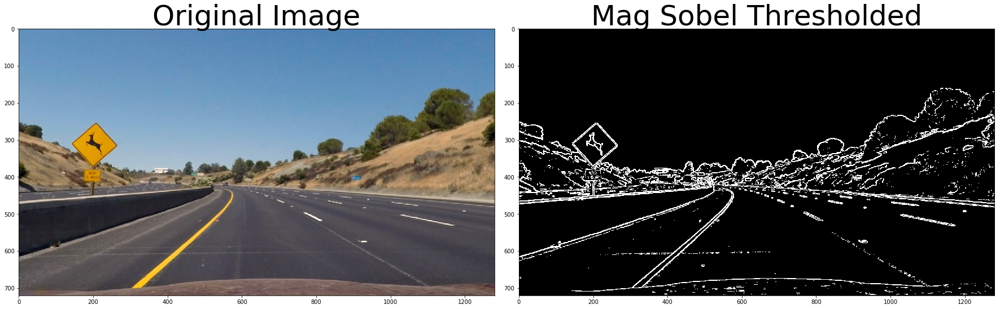

In [15]:
mag_sobel = mag_sobel_threshold(test_image, thresh = (30, 200), ksize = 3)

f, (ax1, ax2) = plt.subplots(1, 2, figsize = (24, 9))
f.tight_layout()
ax1.imshow(test_image)
ax1.set_title('Original Image', fontsize = 50)
ax2.imshow(mag_sobel, cmap='gray')
ax2.set_title('Mag Sobel Thresholded', fontsize = 50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

In [16]:
# Function to calculate direction of gradient across x, y and return a binary thresholded image
def dir_sobel_threshold(img, thresh = (0, np.pi/2), ksize = 3):
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    sobel_x = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize = ksize)
    sobel_y = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize = ksize)
    dir_sobel = np.arctan2(np.absolute(sobel_y), np.absolute(sobel_x))
    binary_dir_sobel = np.zeros_like(dir_sobel)
    binary_dir_sobel[(dir_sobel >= thresh[0]) & (dir_sobel <= thresh[1])] = 1
    return binary_dir_sobel

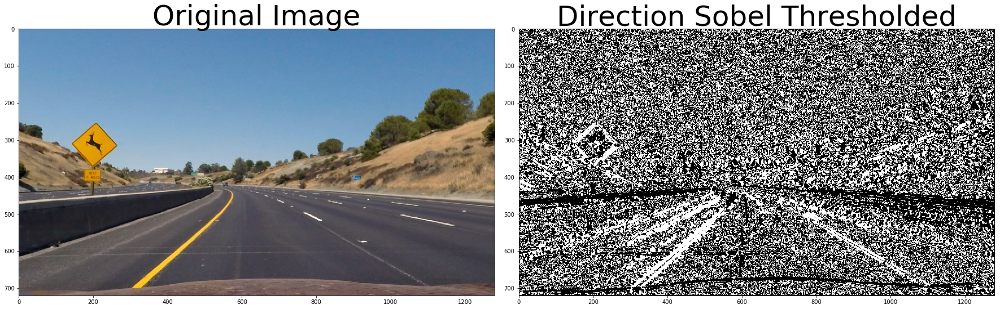

In [17]:
dir_sobel = dir_sobel_threshold(test_image, thresh = (0.7, 1.3), ksize = 15)

f, (ax1, ax2) = plt.subplots(1, 2, figsize = (24, 9))
f.tight_layout()
ax1.imshow(test_image)
ax1.set_title('Original Image', fontsize = 50)
ax2.imshow(dir_sobel, cmap='gray')
ax2.set_title('Direction Sobel Thresholded', fontsize = 50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

In [18]:
# Function to return Saturation thresholded image
def s_thresholded(img, thresh = (0, 255)):
    hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
    s = hls[:,:,2]
    binary_s = np.zeros_like(s)
    binary_s[(s >= thresh[0]) & (s <= thresh[1])] = 1
    return binary_s

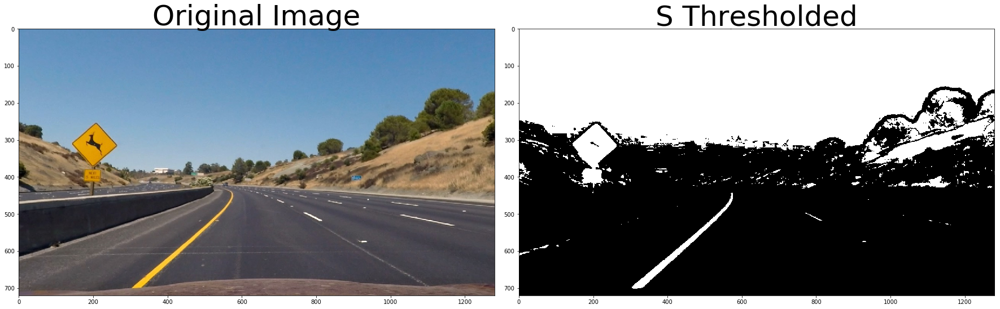

In [19]:
s_thresholded_img = s_thresholded(test_image, thresh = (90, 255))

f, (ax1, ax2) = plt.subplots(1, 2, figsize = (24, 9))
f.tight_layout()
ax1.imshow(test_image)
ax1.set_title('Original Image', fontsize = 50)
ax2.imshow(s_thresholded_img, cmap='gray')
ax2.set_title('S Thresholded', fontsize = 50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

In [20]:
# Function to return H thresholded image
def h_thresholded(img, thresh = (0, 255)):
    hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
    h = hls[:,:,0]
    binary_h = np.zeros_like(h)
    binary_h[(h >= thresh[0]) & (h <= thresh[1])] = 1
    return binary_h

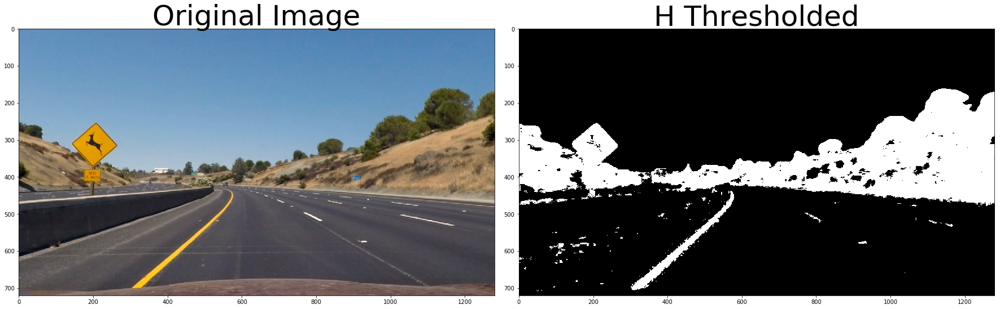

In [21]:
h_thresholded_img = h_thresholded(test_image, thresh = (15, 80))

f, (ax1, ax2) = plt.subplots(1, 2, figsize = (24, 9))
f.tight_layout()
ax1.imshow(test_image)
ax1.set_title('Original Image', fontsize = 50)
ax2.imshow(h_thresholded_img, cmap='gray')
ax2.set_title('H Thresholded', fontsize = 50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

In [22]:
# Function to return L thresholded image
def l_thresholded(img, thresh = (0, 255)):
    hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
    l = hls[:,:,1]
    binary_l = np.zeros_like(l)
    binary_l[(l >= thresh[0]) & (l <= thresh[1])] = 1
    return binary_l

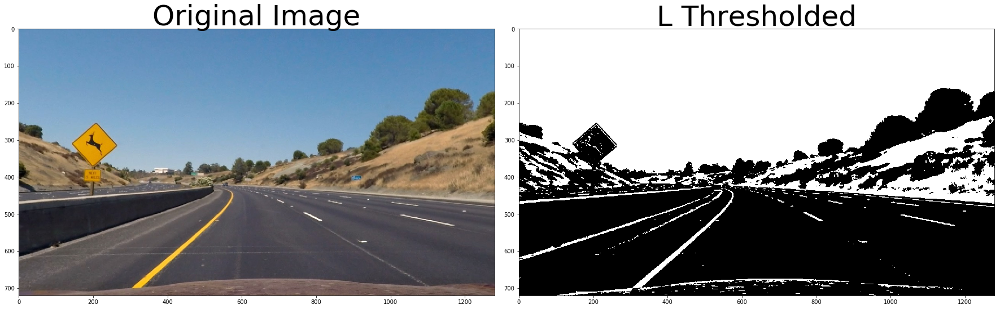

In [23]:
l_thresholded_img = l_thresholded(test_image, thresh = (120, 255))

f, (ax1, ax2) = plt.subplots(1, 2, figsize = (24, 9))
f.tight_layout()
ax1.imshow(test_image)
ax1.set_title('Original Image', fontsize = 50)
ax2.imshow(l_thresholded_img, cmap='gray')
ax2.set_title('L Thresholded', fontsize = 50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

In [24]:
# Function to return R thresholded image
def r_thresholded(img, thresh = (0, 255)):
    r = img[:,:,0]
    binary_r = np.zeros_like(r)
    binary_r[(r >= thresh[0]) & (r <= thresh[1])] = 1
    return binary_r

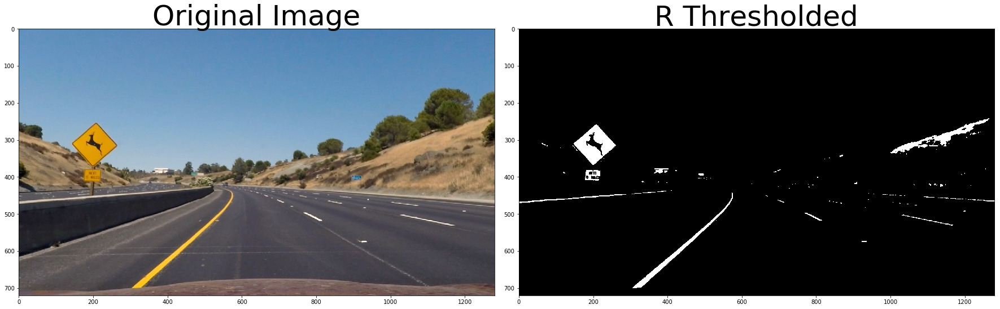

In [25]:
r_thresholded_img = r_thresholded(test_image, thresh = (200, 255))

f, (ax1, ax2) = plt.subplots(1, 2, figsize = (24, 9))
f.tight_layout()
ax1.imshow(test_image)
ax1.set_title('Original Image', fontsize = 50)
ax2.imshow(r_thresholded_img, cmap='gray')
ax2.set_title('R Thresholded', fontsize = 50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

In [26]:
# Creating a image combined, undistortion, gradient, s and r threshold
def combined_binary(img):
    undistorted_img = cal_undistort(img, obj_points, img_points)
    
    sobel_binary_x = abs_sobel_threshold(undistorted_img, orient = 'x', thresh = (20, 200), ksize = 15)
    sobel_binary_y = abs_sobel_threshold(undistorted_img, orient = 'y', thresh = (20, 200), ksize = 15)
    mag_sobel = mag_sobel_threshold(undistorted_img, thresh = (30, 200), ksize = 3)
    dir_sobel = dir_sobel_threshold(undistorted_img, thresh = (0.7, 1.3), ksize = 15)
    s_thresholded_img = s_thresholded(undistorted_img, thresh = (90, 255))
    r_thresholded_img = r_thresholded(undistorted_img, thresh = (200, 255))
    h_thresholded_img = h_thresholded(undistorted_img, thresh = (15, 80))
    l_thresholded_img = l_thresholded(undistorted_img, thresh = (120, 255))
    
    shr_combined = np.zeros_like(sobel_binary_x)
    shr_combined[((s_thresholded_img == 1) & (h_thresholded_img == 1)) | (r_thresholded_img == 1)] = 1
    
    xymd_combined = np.zeros_like(sobel_binary_x)
    xymd_combined[((sobel_binary_x == 1) & (sobel_binary_y == 1)) | ((mag_sobel == 1) & (dir_sobel ==1))] = 1
    
    xymdhl_combined = np.zeros_like(sobel_binary_x)
    xymdhl_combined[((h_thresholded_img == 1) & (l_thresholded_img == 1) & (xymd_combined == 1))] = 1
    
    binary_combined = np.zeros_like(sobel_binary_x)
    binary_combined[((shr_combined == 1) | (xymdhl_combined == 1))] = 1
    return binary_combined

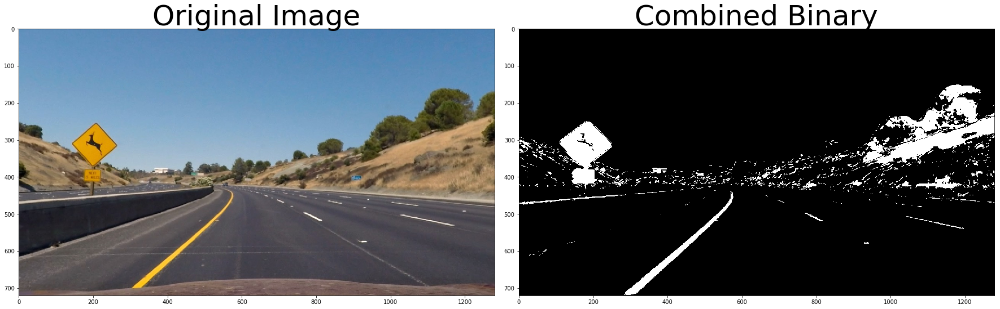

In [27]:
combined_binary_img = combined_binary(test_image)

f, (ax1, ax2) = plt.subplots(1, 2, figsize = (24, 9))
f.tight_layout()
ax1.imshow(test_image)
ax1.set_title('Original Image', fontsize = 50)
ax2.imshow(combined_binary_img, cmap='gray')
ax2.set_title('Combined Binary', fontsize = 50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

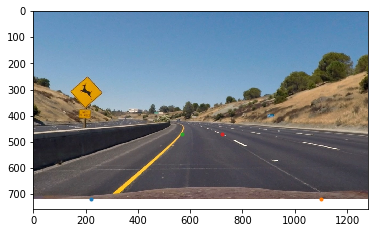

In [28]:
# Loading a image with straight lanes to get source points for perspective transform
plt.imshow(test_image)
plt.plot(220, 720, '.')
plt.plot(1100, 720, '.')
plt.plot(570, 470, '.')
plt.plot(722, 470, '.')

plt.show()

In [29]:
# Function to perform perspective transform and return birds eye view of road.
def perspective_transform(img):
    src = np.float32(
        [[220, 720], 
         [1100, 720], 
         [570, 470], 
         [722, 470]])
    
    dst = np.float32(
        [[320,720], 
         [920, 720], 
         [320, 1], 
         [920, 1]])
    
    M = cv2.getPerspectiveTransform(src, dst)
    Minv = cv2.getPerspectiveTransform(dst, src)
    img_size = (img.shape[1], img.shape[0])
    warped = cv2.warpPerspective(img, M, img_size, flags=cv2.INTER_LINEAR)
    return warped, Minv

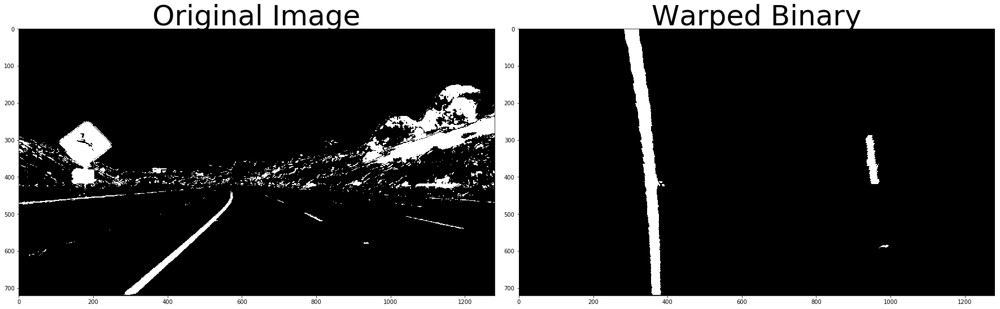

In [30]:
warped_img, Minv = perspective_transform(combined_binary_img)

f, (ax1, ax2) = plt.subplots(1, 2, figsize = (24, 9))
f.tight_layout()
ax1.imshow(combined_binary_img, cmap = 'gray')
ax1.set_title('Original Image', fontsize = 50)
ax2.imshow(warped_img, cmap = 'gray')
ax2.set_title('Warped Binary', fontsize = 50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

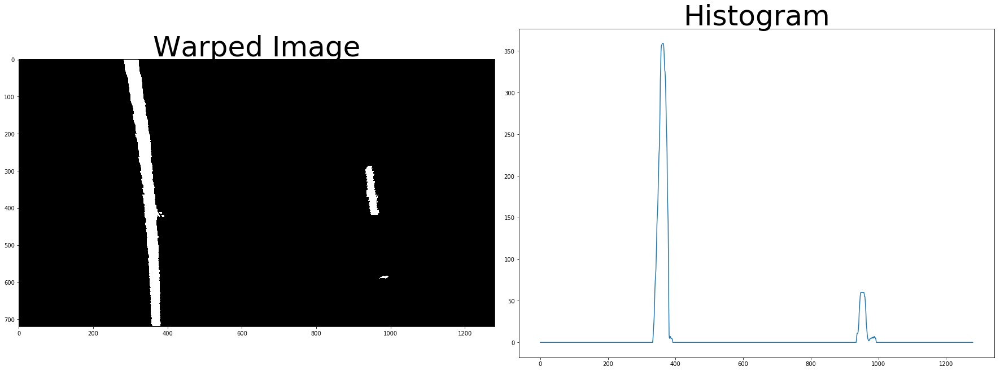

In [31]:
histogram = np.sum(warped_img[warped_img.shape[0]//2:,:], axis=0)

f, (ax1, ax2) = plt.subplots(1, 2, figsize = (24, 9))
f.tight_layout()
ax1.imshow(warped_img, cmap='gray')
ax1.set_title('Warped Image', fontsize = 50)
ax2.plot(histogram)
ax2.set_title('Histogram', fontsize = 50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

As we can see from above histogram that there are two peak points. These two peak points correspond to the position where lane lines are.

In [32]:
# function to visualize lane markings in warped image
def visualize_lane_marking(binary_warped, left_fit, right_fit, left_lane_inds, right_lane_inds, nonzerox, nonzeroy, margin):
    img_size = binary_warped.shape
    
    ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    
    out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255
    window_img = np.zeros_like(out_img)
    out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
    out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]

    left_line_window1 = np.array([np.transpose(np.vstack([left_fitx-margin, ploty]))])
    left_line_window2 = np.array([np.flipud(np.transpose(np.vstack([left_fitx+margin, 
                              ploty])))])
    left_line_pts = np.hstack((left_line_window1, left_line_window2))
    right_line_window1 = np.array([np.transpose(np.vstack([right_fitx-margin, ploty]))])
    right_line_window2 = np.array([np.flipud(np.transpose(np.vstack([right_fitx+margin, 
                              ploty])))])
    right_line_pts = np.hstack((right_line_window1, right_line_window2))
    
    cv2.fillPoly(window_img, np.int_([left_line_pts]), (0,255, 0))
    cv2.fillPoly(window_img, np.int_([right_line_pts]), (0,255, 0))
    result = cv2.addWeighted(out_img, 1, window_img, 0.3, 0)
    plt.imshow(result)
    plt.plot(left_fitx, ploty, color='yellow')
    plt.plot(right_fitx, ploty, color='yellow')
    plt.xlim(0, 1280)
    plt.ylim(720, 0)
    plt.show()

In [33]:
# Function to calculate radius of curvature
def cal_radius_of_cuvature(warped_img, fit):
    y_vals = np.linspace(0, warped_img.shape[0]-1, warped_img.shape[0] )
    x_vals = fit[0]*y_vals**2 + fit[1]*y_vals + fit[2]
    y_eval = np.max(y_vals)
    ym_per_pix = 30/720 
    xm_per_pix = 3.7/700
    fit_cr = np.polyfit(y_vals*ym_per_pix, x_vals*xm_per_pix, 2)
    curverad = ((1 + (2*fit_cr[0]*y_eval*ym_per_pix + fit_cr[1])**2)**1.5) / np.absolute(2*fit_cr[0])
    return curverad

In [34]:
# Function to calculate center offset
def cal_center_offset(warped_img, l_fit, r_fit):
    xm_per_pix = 3.7/700
    h = warped_img.shape[0]
    camera_position = warped_img.shape[1]/2
    l_fit_x_int = l_fit[0]*h**2 + l_fit[1]*h + l_fit[2]
    r_fit_x_int = r_fit[0]*h**2 + r_fit[1]*h + r_fit[2]
    lane_center_position = (r_fit_x_int + l_fit_x_int) /2
    center_dist = (camera_position - lane_center_position) * xm_per_pix
    return center_dist

In [35]:
def sliding_window_search(binary_warped, displayVisualization = False):
    img_size = binary_warped.shape
    histogram = np.sum(binary_warped[binary_warped.shape[0]//2:,:], axis=0)
    out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255
    midpoint = np.int(histogram.shape[0]/2)
    leftx_base = np.argmax(histogram[:midpoint])
    rightx_base = np.argmax(histogram[midpoint:]) + midpoint
    
    nwindows = 9
    window_height = np.int(binary_warped.shape[0]/nwindows)
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    leftx_current = leftx_base
    rightx_current = rightx_base
    margin = 100
    minpix = 50
    left_lane_inds = []
    right_lane_inds = []
    for window in range(nwindows):
        win_y_low = binary_warped.shape[0] - (window+1)*window_height
        win_y_high = binary_warped.shape[0] - window*window_height
        win_xleft_low = leftx_current - margin
        win_xleft_high = leftx_current + margin
        win_xright_low = rightx_current - margin
        win_xright_high = rightx_current + margin
        cv2.rectangle(out_img,(win_xleft_low,win_y_low),(win_xleft_high,win_y_high),(0,255,0), 2) 
        cv2.rectangle(out_img,(win_xright_low,win_y_low),(win_xright_high,win_y_high),(0,255,0), 2) 
        good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & (nonzerox >= win_xleft_low) &  (nonzerox < win_xleft_high)).nonzero()[0]
        good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & (nonzerox >= win_xright_low) &  (nonzerox < win_xright_high)).nonzero()[0]
        left_lane_inds.append(good_left_inds)
        right_lane_inds.append(good_right_inds)
        if len(good_left_inds) > minpix:
            leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
        if len(good_right_inds) > minpix:        
            rightx_current = np.int(np.mean(nonzerox[good_right_inds]))
    left_lane_inds = np.concatenate(left_lane_inds)
    right_lane_inds = np.concatenate(right_lane_inds)
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds] 
    
    try:
        left_fit = np.polyfit(lefty, leftx, 2)
        right_fit = np.polyfit(righty, rightx, 2)
        if displayVisualization == True:
            visualize_lane_marking(binary_warped, left_fit, right_fit, left_lane_inds, right_lane_inds, nonzerox, nonzeroy, margin)
        return left_fit, right_fit
    except:
        return None, None

In [36]:
def continue_search_from_previous(binary_warped, left_fit, right_fit):
    img_size = binary_warped.shape
    out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    margin = 100
    left_lane_inds = ((nonzerox > (left_fit[0]*(nonzeroy**2) + left_fit[1]*nonzeroy + left_fit[2] - margin)) & (nonzerox < (left_fit[0]*(nonzeroy**2) + left_fit[1]*nonzeroy + left_fit[2] + margin))) 
    right_lane_inds = ((nonzerox > (right_fit[0]*(nonzeroy**2) + right_fit[1]*nonzeroy + right_fit[2] - margin)) & (nonzerox < (right_fit[0]*(nonzeroy**2) + right_fit[1]*nonzeroy + right_fit[2] + margin)))
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]
    
    try:
        left_fit = np.polyfit(lefty, leftx, 2)
        right_fit = np.polyfit(righty, rightx, 2)
        return left_fit, right_fit
    except:
        return None, None

In [37]:
def visualizer_lane_on_original_image(original_img, warped_img, Minv, left_fit, right_fit):
    
    ploty = np.linspace(0, warped_img.shape[0]-1, warped_img.shape[0] )
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    
    warp_zero = np.zeros_like(warped_img).astype(np.uint8)
    color_warp = np.dstack((warp_zero, warp_zero, warp_zero))
    pts_left = np.array([np.transpose(np.vstack([left_fitx, ploty]))])
    pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, ploty])))])
    pts = np.hstack((pts_left, pts_right))
    cv2.fillPoly(color_warp, np.int_([pts]), (0,255, 0))
    newwarp = cv2.warpPerspective(color_warp, Minv, (warped_img.shape[1], warped_img.shape[0]))
    result = cv2.addWeighted(original_img, 1, newwarp, 0.3, 0)
    return result

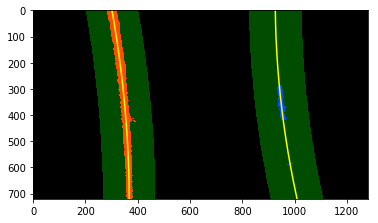

1383.3339887 m 1144.02386473 m -0.256757567829 m


In [40]:
left_fit, right_fit = sliding_window_search(warped_img, displayVisualization=True)
left_curvature = cal_radius_of_cuvature(warped_img, left_fit)
right_curvature = cal_radius_of_cuvature(warped_img, right_fit)
center_offset = cal_center_offset(warped_img, left_fit, right_fit)
print(left_curvature, 'm', right_curvature, 'm', center_offset, 'm')

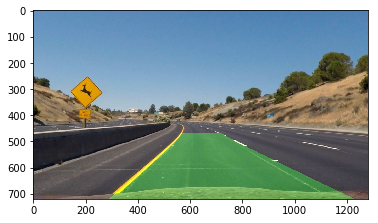

In [41]:
result = visualizer_lane_on_original_image(test_image, warped_img, Minv, left_fit, right_fit)
plt.imshow(result)

In [42]:
from moviepy.editor import VideoFileClip
from IPython.display import HTML

In [43]:
class Line():
    def __init__(self):
        # was the line detected in the last iteration?
        self.detected = False  
        # x values of the last n fits of the line
        self.recent_xfitted = [] 
        #average x values of the fitted line over the last n iterations
        self.bestx = None     
        #polynomial coefficients averaged over the last n iterations
        self.best_fit = None  
        #polynomial coefficients for the most recent fit
        self.current_fit = []  
        #radius of curvature of the line in some units
        self.radius_of_curvature = None 
        #distance in meters of vehicle center from the line
        self.line_base_pos = None 
        #difference in fit coefficients between last and new fits
        self.diffs = np.array([0,0,0], dtype='float') 
        #x values for detected line pixels
        self.allx = None  
        #y values for detected line pixels
        self.ally = None
        self.n_iterations = 5
        
    def _add_fit(self, fit, radius_of_curvature):
        self.detected = True
        self.current_fit.append(fit)
        self.best_fit = np.average(self.current_fit[-self.n_iterations:], axis=0)
        self.radius_of_curvature = radius_of_curvature
        
    def add_fit(self, warped_image, fit):
        if fit is not None:
            new_radius_of_curvature = cal_radius_of_cuvature(warped_image, fit)
            if self.best_fit is not None:
                self.diffs = abs(fit-self.best_fit)
                
            if self.radius_of_curvature is None:
                self._add_fit(fit, new_radius_of_curvature)
            elif new_radius_of_curvature < 240 or (new_radius_of_curvature/self.radius_of_curvature) < 0.1:
                self.detected = False
            elif (self.diffs[0] > 0.001 or self.diffs[1] > 1.0 or self.diffs[2] > 100.):
                self.detected = False
            else:
                self._add_fit(fit, new_radius_of_curvature)
        else:
            self.detected = False
                

In [44]:
def process_frame(frame):
    combined_binary_img = combined_binary(frame)
    warped_img, Minv = perspective_transform(combined_binary_img)
    if l_line.detected == False or r_line.detected == False:
        left_fit, right_fit = sliding_window_search(warped_img)
    else:
        left_fit, right_fit = continue_search_from_previous(warped_img, l_line.best_fit, r_line.best_fit)
        
    l_line.add_fit(warped_img, left_fit)
    r_line.add_fit(warped_img, right_fit)
    center_offset = cal_center_offset(warped_img, l_line.best_fit, r_line.best_fit)
    print(l_line.radius_of_curvature, 'm', r_line.radius_of_curvature, 'm')
    result = visualizer_lane_on_original_image(frame, warped_img, Minv, l_line.best_fit, r_line.best_fit)
    curvature_string = "Radius of curvature: %.2f m" % ((l_line.radius_of_curvature + r_line.radius_of_curvature)/2.0)
    cv2.putText(result,curvature_string , (100, 90), cv2.FONT_HERSHEY_SIMPLEX, 1.5, (255,255,255), thickness=2)
    if center_offset <= 0:
        center_offset_string = "Vehicle is %.2f m left of center" % abs(center_offset)
    else:
        center_offset_string = "Vehicle is %.2f m right of center" % abs(center_offset)
    cv2.putText(result,center_offset_string, (100, 150), cv2.FONT_HERSHEY_SIMPLEX, 1.5, (255,255,255), thickness=2)
    plt.imshow(result)
    plt.show()
    return result

1490.02843015 m 1298.80258597 m


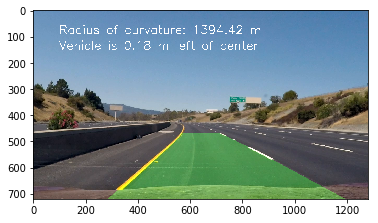

[MoviePy] >>>> Building video output_videos/project_video.mp4
[MoviePy] Writing video output_videos/project_video.mp4


  0%|          | 0/401 [00:00<?, ?it/s]

1490.02843015 m 1298.80258597 m


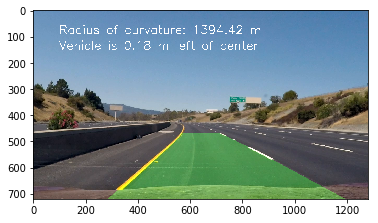

  0%|          | 1/401 [00:01<08:29,  1.27s/it]

1287.71201872 m 1654.61554568 m


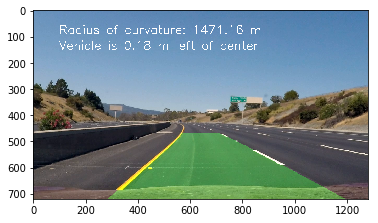

  0%|          | 2/401 [00:02<08:32,  1.29s/it]

1200.46186424 m 1879.63512423 m


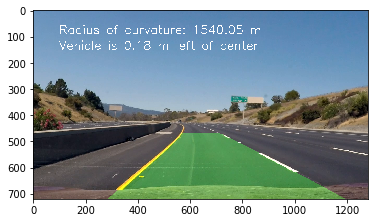

  1%|          | 3/401 [00:03<08:42,  1.31s/it]

1137.73620847 m 1810.20727094 m


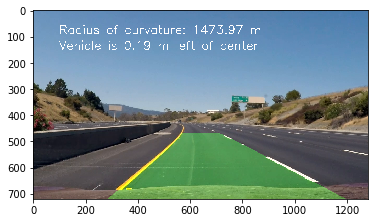

  1%|          | 4/401 [00:05<08:42,  1.32s/it]

1090.53824077 m 1470.50142033 m


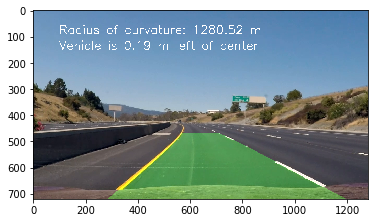

  1%|          | 5/401 [00:06<08:44,  1.32s/it]

1070.27719927 m 1323.51335706 m


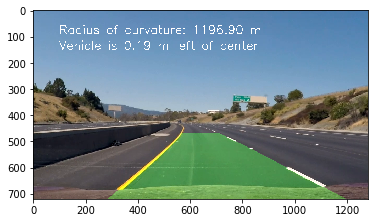

  1%|▏         | 6/401 [00:07<08:46,  1.33s/it]

1106.84786304 m 2521.68251842 m


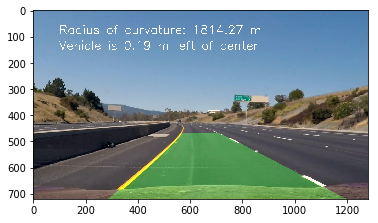

  2%|▏         | 7/401 [00:09<08:43,  1.33s/it]

1110.97595828 m 1914.40512259 m


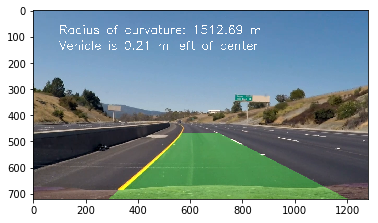

  2%|▏         | 8/401 [00:10<08:51,  1.35s/it]

1181.50011857 m 3816.60191832 m


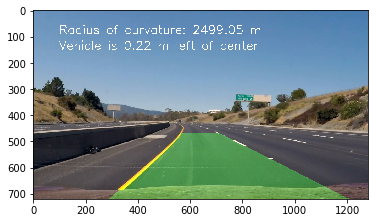

  2%|▏         | 9/401 [00:12<08:48,  1.35s/it]

1172.39804909 m 1484.47147794 m


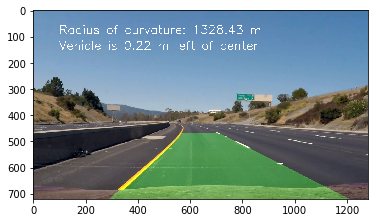

  2%|▏         | 10/401 [00:13<08:44,  1.34s/it]

1117.97328961 m 1605.48733701 m


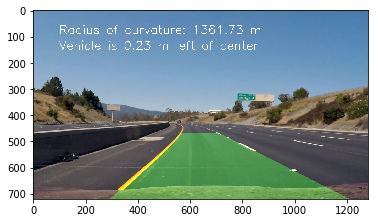

  3%|▎         | 11/401 [00:14<08:40,  1.33s/it]

1249.99340406 m 1749.61965168 m


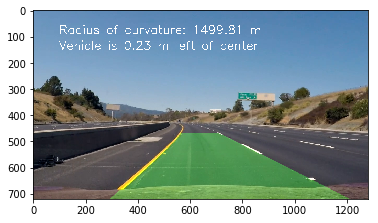

  3%|▎         | 12/401 [00:16<08:39,  1.33s/it]

1258.48118911 m 1481.70471764 m


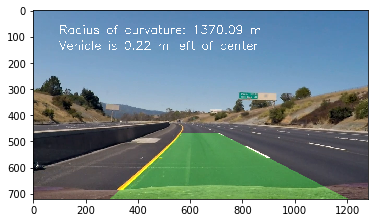

  3%|▎         | 13/401 [00:17<08:36,  1.33s/it]

1232.94760528 m 2536.1716914 m


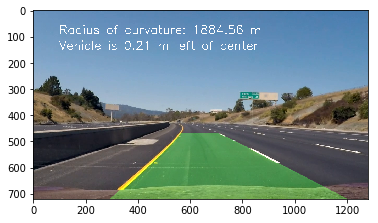

  3%|▎         | 14/401 [00:18<08:36,  1.34s/it]

1369.02790805 m 2401.60365227 m


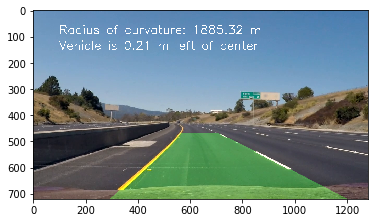

  4%|▎         | 15/401 [00:19<08:25,  1.31s/it]

1338.39348375 m 2014.32177914 m


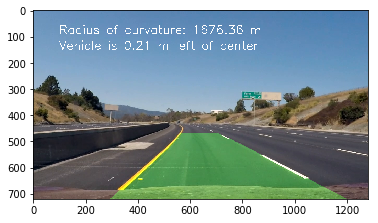

  4%|▍         | 16/401 [00:21<08:13,  1.28s/it]

1340.61173538 m 1581.93434443 m


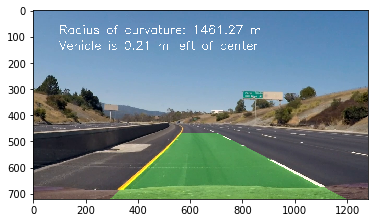

  4%|▍         | 17/401 [00:22<08:14,  1.29s/it]

1468.41863945 m 3021.35084547 m


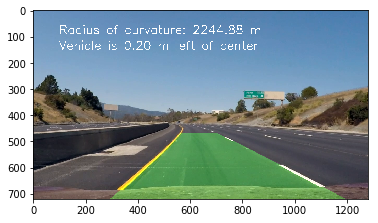

  4%|▍         | 18/401 [00:23<08:22,  1.31s/it]

1679.94509795 m 11575.3921647 m


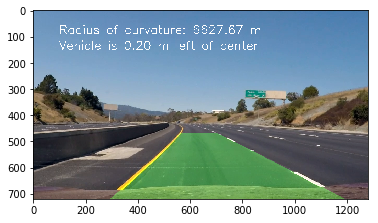

  5%|▍         | 19/401 [00:25<08:32,  1.34s/it]

2035.54672966 m 12648.121217 m


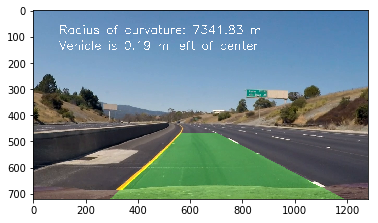

  5%|▍         | 20/401 [00:26<08:30,  1.34s/it]

2589.04071638 m 1303.92339607 m


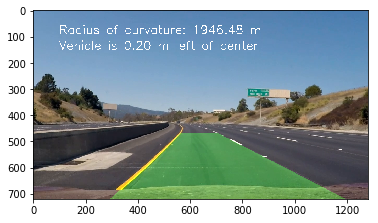

  5%|▌         | 21/401 [00:27<08:24,  1.33s/it]

3562.71419038 m 1407.86625054 m


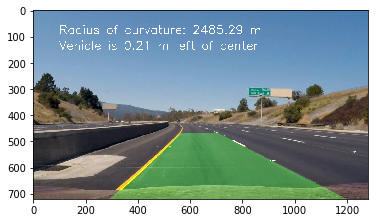

  5%|▌         | 22/401 [00:29<08:21,  1.32s/it]

4201.13726595 m 1834.26926931 m


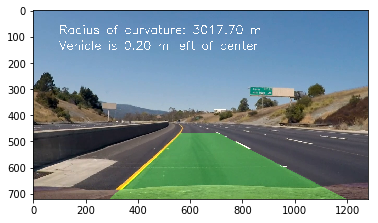

  6%|▌         | 23/401 [00:30<08:11,  1.30s/it]

3580.87904748 m 1894.88113508 m


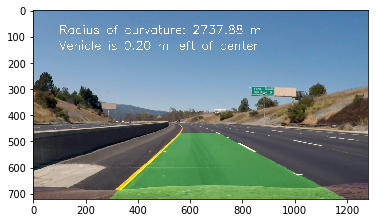

  6%|▌         | 24/401 [00:31<08:15,  1.31s/it]

2681.14681674 m 1721.96175014 m


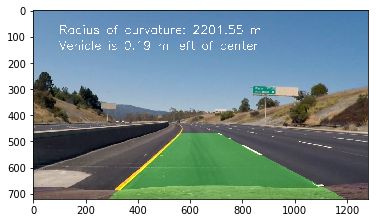

  6%|▌         | 25/401 [00:33<08:11,  1.31s/it]

2697.21686314 m 1241.29651115 m


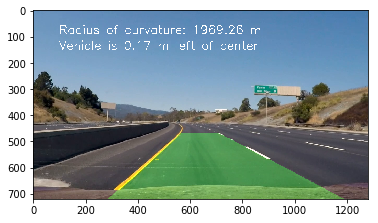

  6%|▋         | 26/401 [00:34<08:20,  1.34s/it]

2512.61849751 m 1443.30603563 m


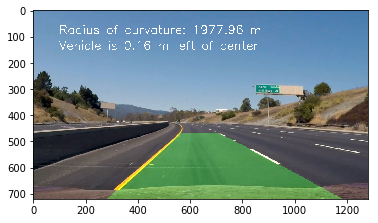

  7%|▋         | 27/401 [00:35<08:18,  1.33s/it]

2433.00412057 m 1450.79996245 m


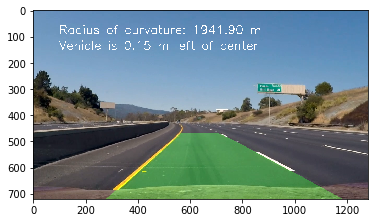

  7%|▋         | 28/401 [00:37<08:14,  1.33s/it]

1896.07803554 m 1581.98000933 m


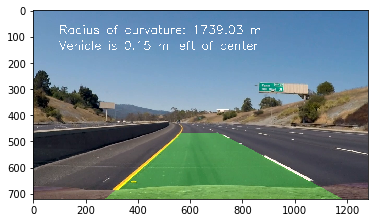

  7%|▋         | 29/401 [00:38<08:13,  1.33s/it]

1596.99664015 m 1325.12500498 m


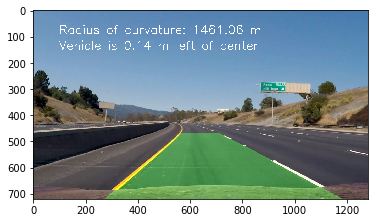

  7%|▋         | 30/401 [00:39<08:25,  1.36s/it]

1393.40042932 m 1226.9438696 m


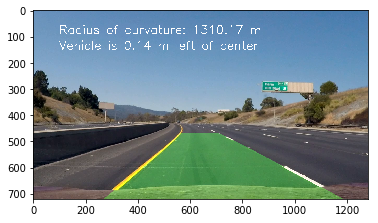

  8%|▊         | 31/401 [00:41<08:23,  1.36s/it]

1260.15966687 m 1648.0854642 m


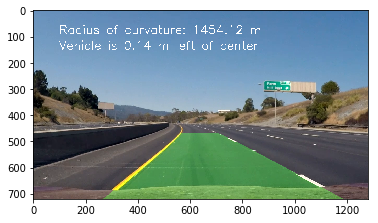

  8%|▊         | 32/401 [00:42<08:16,  1.35s/it]

1249.18209807 m 1772.56426464 m


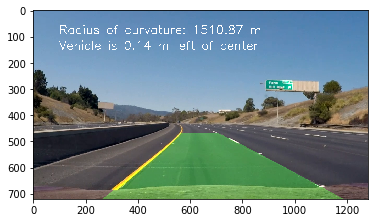

  8%|▊         | 33/401 [00:43<08:15,  1.35s/it]

1263.89155946 m 11466.0280327 m


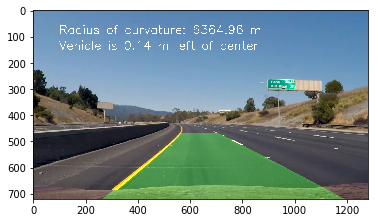

  8%|▊         | 34/401 [00:45<08:07,  1.33s/it]

1313.80621998 m 1692.84365893 m


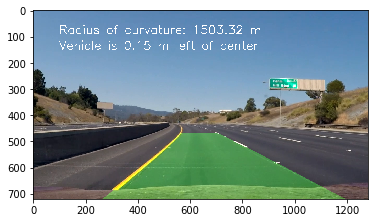

  9%|▊         | 35/401 [00:46<08:06,  1.33s/it]

1157.83657563 m 1652.65701814 m


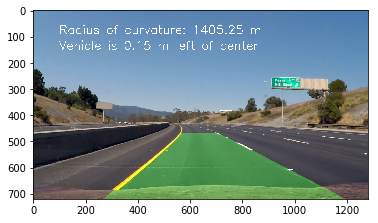

  9%|▉         | 36/401 [00:47<08:04,  1.33s/it]

1211.75016686 m 1420.63305601 m


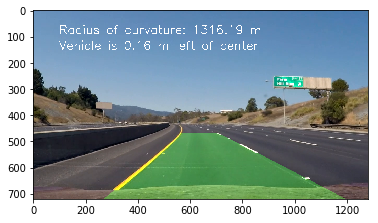

  9%|▉         | 37/401 [00:49<08:03,  1.33s/it]

1120.71105502 m 3906.10974801 m


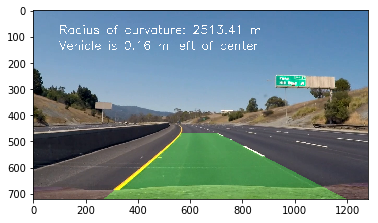

  9%|▉         | 38/401 [00:50<08:03,  1.33s/it]

1046.76124572 m 4486.34031066 m


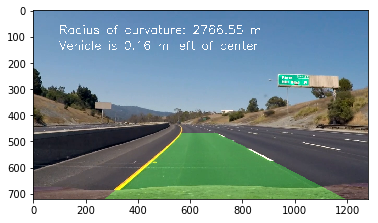

 10%|▉         | 39/401 [00:51<08:01,  1.33s/it]

997.100241995 m 3113.09389675 m


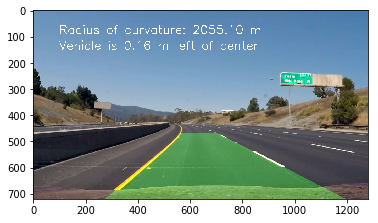

 10%|▉         | 40/401 [00:53<07:56,  1.32s/it]

965.571981341 m 1584.66596733 m


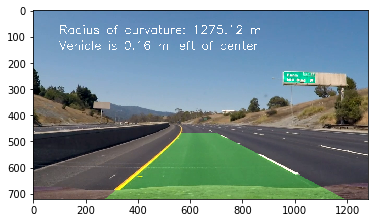

 10%|█         | 41/401 [00:54<08:04,  1.35s/it]

899.615194493 m 1356.85283253 m


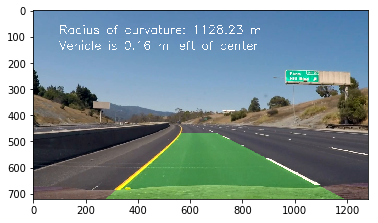

 10%|█         | 42/401 [00:55<08:00,  1.34s/it]

876.417486039 m 1194.34148896 m


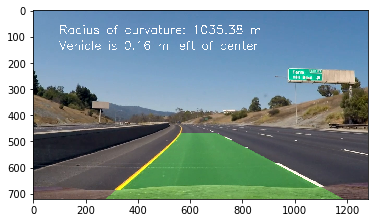

 11%|█         | 43/401 [00:57<07:57,  1.34s/it]

875.041926808 m 1293.47711792 m


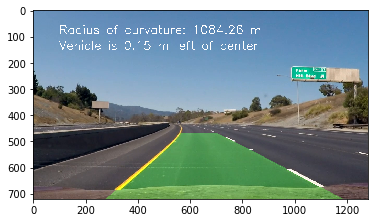

 11%|█         | 44/401 [00:58<07:59,  1.34s/it]

879.391337358 m 1279.8065714 m


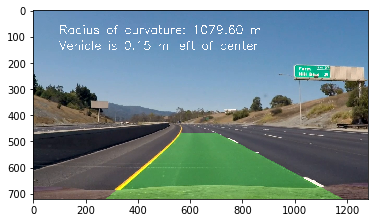

 11%|█         | 45/401 [00:59<07:54,  1.33s/it]

930.484869517 m 12029.8026711 m


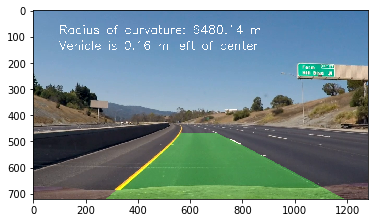

 11%|█▏        | 46/401 [01:01<07:53,  1.33s/it]

917.722369437 m 3925.13818253 m


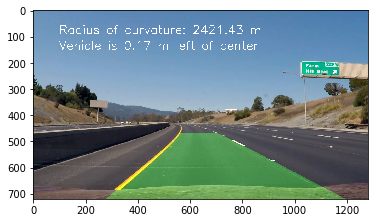

 12%|█▏        | 47/401 [01:02<07:53,  1.34s/it]

1000.40034526 m 1264.98020645 m


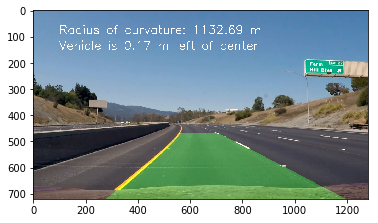

 12%|█▏        | 48/401 [01:03<07:51,  1.34s/it]

992.31792355 m 1376.8451135 m


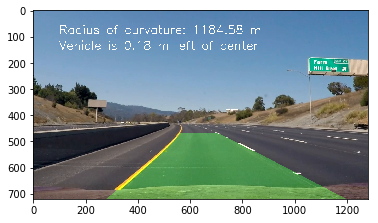

 12%|█▏        | 49/401 [01:05<07:49,  1.33s/it]

1021.23116929 m 1626.12516315 m


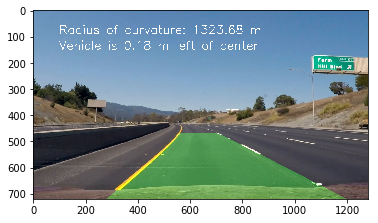

 12%|█▏        | 50/401 [01:06<07:50,  1.34s/it]

1051.20661983 m 1613.24266836 m


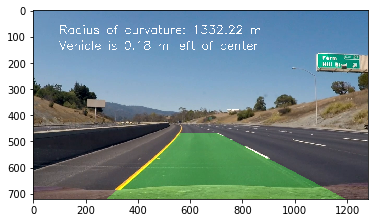

 13%|█▎        | 51/401 [01:07<07:46,  1.33s/it]

1097.18512834 m 1542.14264005 m


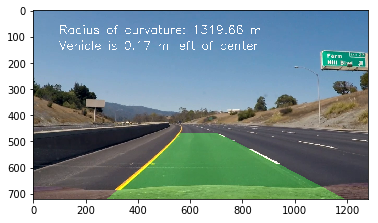

 13%|█▎        | 52/401 [01:09<07:51,  1.35s/it]

1138.21745679 m 1671.13691218 m


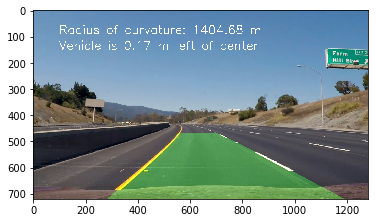

 13%|█▎        | 53/401 [01:10<07:56,  1.37s/it]

1290.22149489 m 1287.72778863 m


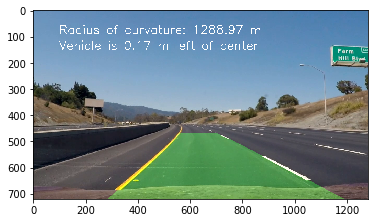

 13%|█▎        | 54/401 [01:12<07:55,  1.37s/it]

1312.97077493 m 1304.64889203 m


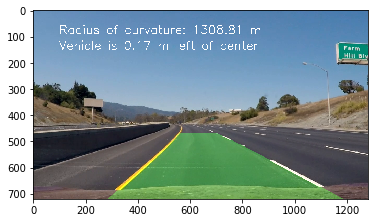

 14%|█▎        | 55/401 [01:13<07:49,  1.36s/it]

1519.42514109 m 1642.04129815 m


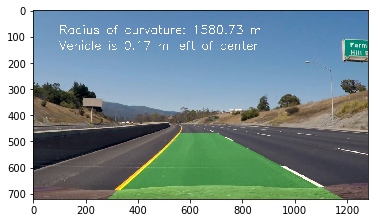

 14%|█▍        | 56/401 [01:14<07:45,  1.35s/it]

1675.57984056 m 1524.4284723 m


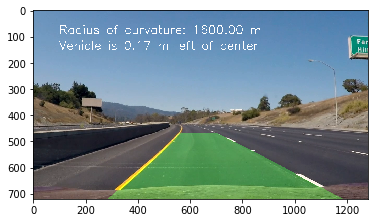

 14%|█▍        | 57/401 [01:16<07:45,  1.35s/it]

1932.16431601 m 1370.64342981 m


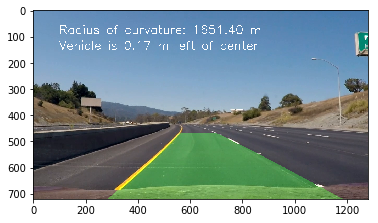

 14%|█▍        | 58/401 [01:17<07:41,  1.35s/it]

2527.70700787 m 1381.69545694 m


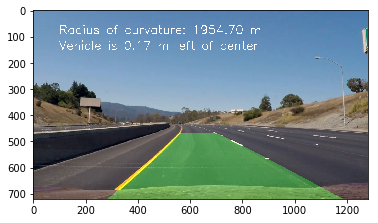

 15%|█▍        | 59/401 [01:18<07:43,  1.36s/it]

2742.24512408 m 1751.70787304 m


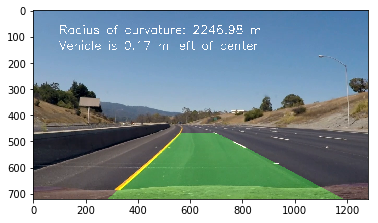

 15%|█▍        | 60/401 [01:20<07:39,  1.35s/it]

3096.94200448 m 1844.40088082 m


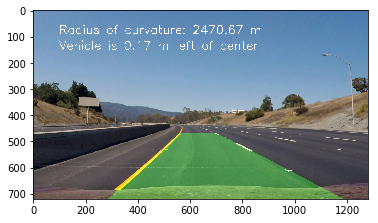

 15%|█▌        | 61/401 [01:21<07:39,  1.35s/it]

2770.70338356 m 3529.24259323 m


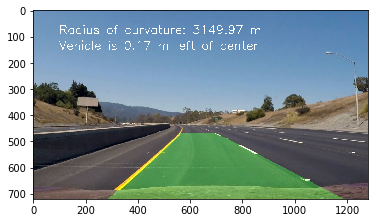

 15%|█▌        | 62/401 [01:22<07:36,  1.35s/it]

2657.73342278 m 2150.39411785 m


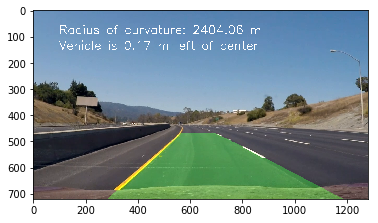

 16%|█▌        | 63/401 [01:24<07:37,  1.35s/it]

2202.02406228 m 1985.78390239 m


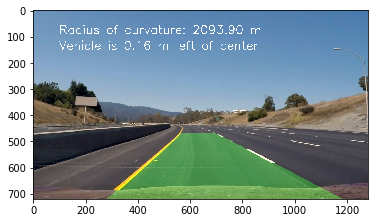

 16%|█▌        | 64/401 [01:25<07:32,  1.34s/it]

1854.0518828 m 1873.77589583 m


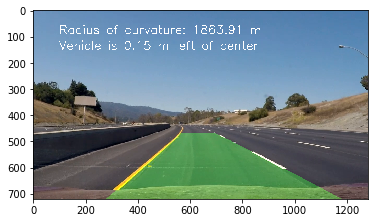

 16%|█▌        | 65/401 [01:26<07:30,  1.34s/it]

1654.03701816 m 1632.37141288 m


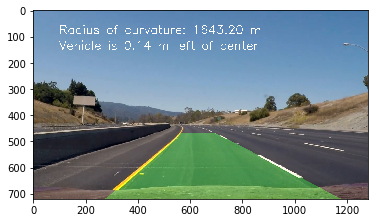

 16%|█▋        | 66/401 [01:28<07:28,  1.34s/it]

1594.51296449 m 1616.4908913 m


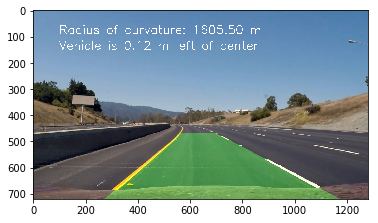

 17%|█▋        | 67/401 [01:29<07:25,  1.33s/it]

1375.45972014 m 2144.41768445 m


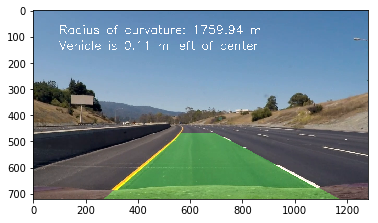

 17%|█▋        | 68/401 [01:30<07:17,  1.31s/it]

1141.10631813 m 2261.837701 m


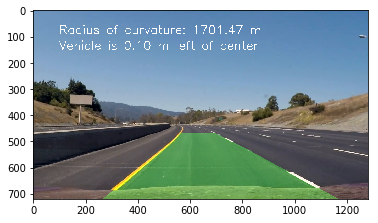

 17%|█▋        | 69/401 [01:32<07:16,  1.32s/it]

1135.88009044 m 2019.73980341 m


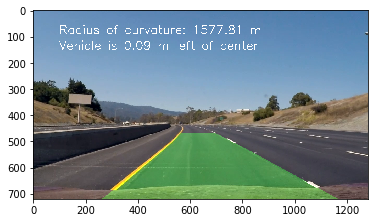

 17%|█▋        | 70/401 [01:33<07:18,  1.32s/it]

1082.73707546 m 1077.14692993 m


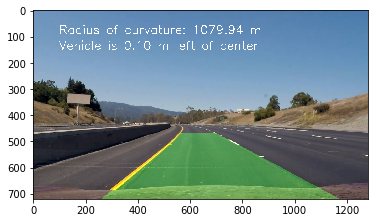

 18%|█▊        | 71/401 [01:34<07:10,  1.31s/it]

1162.10867263 m 1778.40136773 m


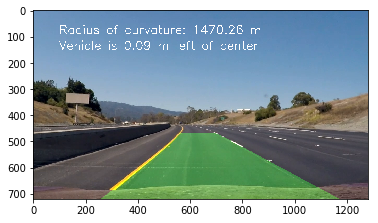

 18%|█▊        | 72/401 [01:36<07:23,  1.35s/it]

1351.8307673 m 2979.01785538 m


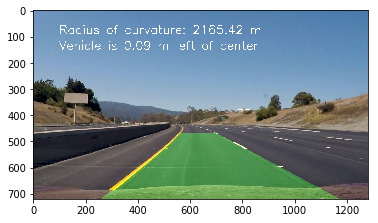

 18%|█▊        | 73/401 [01:37<07:24,  1.36s/it]

1435.10325902 m 2978.30510741 m


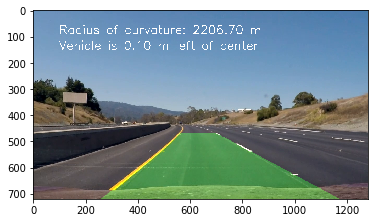

 18%|█▊        | 74/401 [01:38<07:26,  1.37s/it]

1538.3913013 m 2578.23595863 m


In [ ]:
l_line = Line()
r_line = Line()

output_project_video = 'output_videos/project_video.mp4'
project_video_clip = VideoFileClip("project_video.mp4")
output_clip = project_video_clip.fl_image(process_frame)
%time output_clip.write_videofile(output_project_video, audio=False)

In [ ]:

HTML("""
<video width="1280" height="720" controls>
  <source src="{0}">
</video>
""".format(output_project_video))

In [ ]:
l_line = Line()
r_line = Line()

output_challenge_video = 'output_videos/challenge_video.mp4'
challenge_video_clip = VideoFileClip("challenge_video.mp4")
output_clip = challenge_video_clip.fl_image(process_frame)
%time output_clip.write_videofile(output_challenge_video, audio=False)

In [ ]:

HTML("""
<video width="1280" height="720" controls>
  <source src="{0}">
</video>
""".format(output_challenge_video))

In [ ]:
l_line = Line()
r_line = Line()

output_harder_video = 'output_videos/harder_challenge_video.mp4'
harder_video_clip = VideoFileClip("harder_challenge_video.mp4").subclip(0, 5)
output_clip = harder_video_clip.fl_image(process_frame)
%time output_clip.write_videofile(output_harder_video, audio=False)

In [ ]:
HTML("""
<video width="1280" height="720" controls>
  <source src="{0}">
</video>
""".format(output_harder_video))